In [1]:
from matplotlib import pyplot as plt
import numpy as np
import cv2

In [2]:
#function to show images
def showInRow(list_of_images, titles = None, disable_ticks = False):
  count = len(list_of_images)
  for idx in range(count):
    subplot = plt.subplot(1, count, idx+1)
    if titles is not None:
      subplot.set_title(titles[idx])

    img = list_of_images[idx]
    cmap = 'gray' if (len(img.shape) == 2 or img.shape[2] == 1) else None
    subplot.imshow(img, cmap=cmap)
    if disable_ticks:
      plt.xticks([]), plt.yticks([])
  plt.show()

<h3>Fire mask segmentation</h3>

In [42]:
def threshold_rgb_fire(scene_rgb):
    """
    Pixel value thresholding for fire in RGB space
    Based on fire's characteristic red-orange-yellow colors
    """
    #extracting channels
    R = scene_rgb[:, :, 0] #red (0-255)
    G = scene_rgb[:, :, 1] #green (0-255)
    B = scene_rgb[:, :, 2] #blue (0-255)
    
    #creating empty mask
    fire_mask_rgb = np.zeros(scene_rgb.shape[:2], dtype=np.uint8)
    
    #rule1: red channel should be dominant (R > G > B)
    rule1 = (R > G) & (G > B)
    
    #rule2: red channel should be strong (R > threshold)
    rule2 = R > 140
    
    #rule3: color ratio constraints (fire pixels have R much larger than B)
    rule3= R > B * 1.5
    
    #rule4: avoid grayscale (color_saturation has to be high)
    color_saturation = (R - np.minimum(G, B)) / (R + 1e-6)
    rule4 = color_saturation > 0.3
    
    #rule combinations
    fire_mask_rgb[(rule1 & rule2 & rule3 & rule4)] = 255
    
    return fire_mask_rgb

def threshold_hsv_fire(scene_hsv):
    """
    Pixel value thresholding for fire in HSV space
    Based on hue, saturation, and value characteristics
    """
    #extracting HSV channels
    H = scene_hsv[:, :, 0]  #hue (0-179)
    S = scene_hsv[:, :, 1]  #saturation (0-255)
    V = scene_hsv[:, :, 2]  #value/brightness (0-255)
    
    #creating empty mask
    fire_mask_hsv = np.zeros(scene_hsv.shape[:2], dtype=np.uint8)
    
    #rule1: hue range for fire colors (red 0-10, orange 11-25, yellow 26-35)
    hue_rule = ((H >= 0) & (H <= 35))
    
    #rule2: high saturation (fire is highly saturated)
    saturation_rule = S > 100
    
    #rule3: high brightness/value (fire is bright)
    value_rule = V > 150
    
    #rule combinations
    fire_mask_hsv[(hue_rule & saturation_rule & value_rule)] = 255
    
    return fire_mask_hsv

def combined_threshhold_fire(scene):
    scene_hsv = cv2.cvtColor(scene, cv2.COLOR_BGR2HSV)
    scene_rgb = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)
    showInRow([scene_rgb, scene_hsv], ['RGB', 'HSV'])
    rgb_mask = threshold_rgb_fire(scene_rgb)
    hsv_mask = threshold_hsv_fire(scene_hsv)
    combined = cv2.bitwise_and(rgb_mask, hsv_mask)
    showInRow([rgb_mask, hsv_mask, combined], ['RGB', 'HSV', 'Combined'])
    return combined

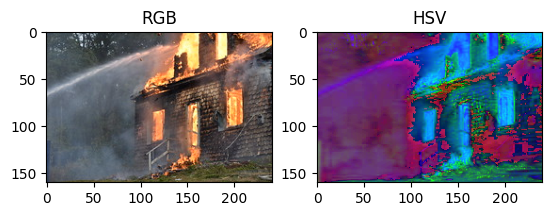

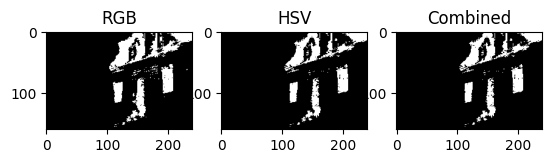

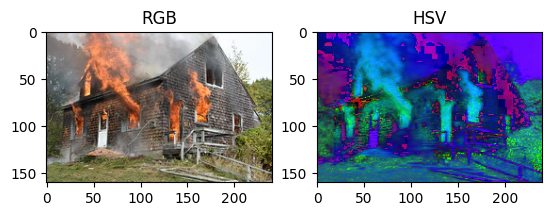

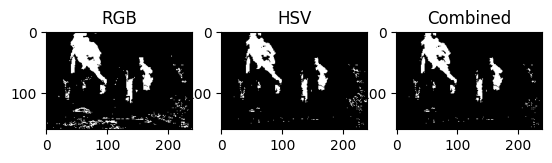

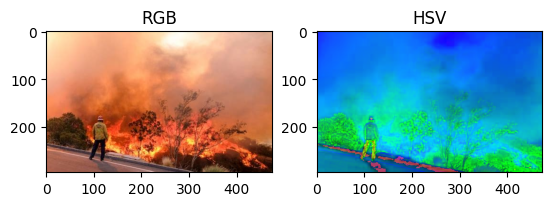

...

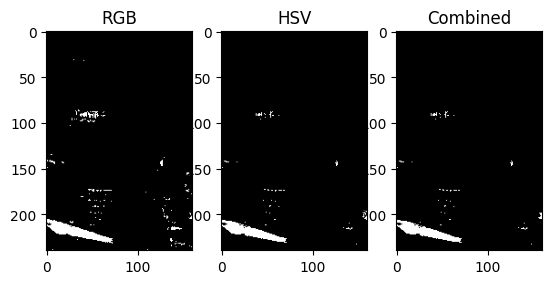

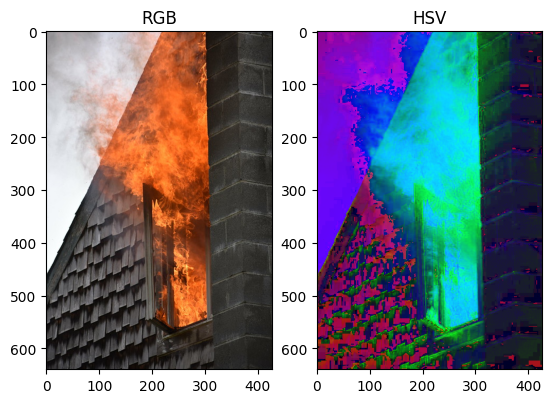

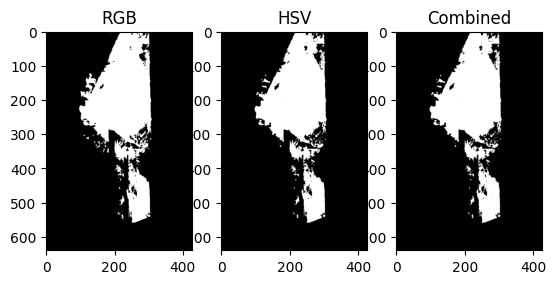

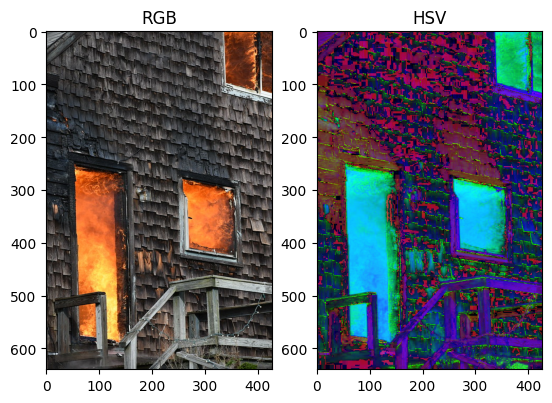

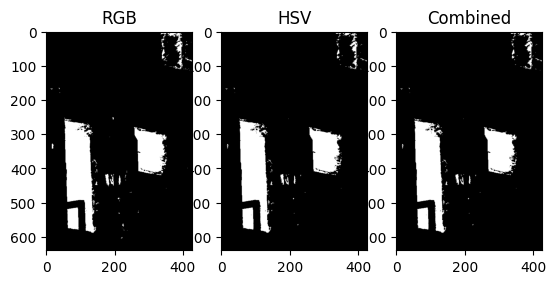

In [43]:
#analysis of the fire_mask segmentation
c = 445
for i in range(10):
    scene = cv2.imread(f"data/fire/fire{c}.jpg")
    combined_fire = combined_threshhold_fire(scene)
    c += 1

<h3>Smoke mask segmentation</h3>

In [ ]:
def threshold_rgb_smoke(scene_rgb):
    """
    Pixel value thresholding for smoke in RGB space
    Based on smoke's characteristic grayish-white colors
    """
    #extracting channels
    R = scene_rgb[:, :, 0]
    G = scene_rgb[:, :, 1]
    B = scene_rgb[:, :, 2]
    
    #creating empty mask
    smoke_mask_rgb = np.zeros(scene_rgb.shape[:2], dtype=np.uint8)
    
    #rule1: smoke colors are typically desaturated (have similar RGB values)
    #so all channels should be relatively close to each other
    max_channel = np.maximum(np.maximum(R, G), B)
    min_channel = np.minimum(np.minimum(R, G), B)
    rule1 = (max_channel - min_channel) < 200
    
    #rule2: smoke is typically bright but not pure white
    rule2 = (max_channel > 100) & (max_channel < 240)
    
    #rule3: smoke pixels should have moderate to high values in all channels
    rule3 = (R > 60) & (G > 60) & (B > 60)
    
    #rule combinations
    smoke_mask_rgb[(rule1 & rule2 & rule3)] = 255
    
    return smoke_mask_rgb

def threshold_ycrcb_smoke(scene_ycrcb):
    """
    Smoke detection in YCrCb color space
    """
    #extract channels
    Y = scene_ycrcb[:, :, 0]   #luminance (0-255)
    Cr = scene_ycrcb[:, :, 1]  #chrominance red (0-255)
    Cb = scene_ycrcb[:, :, 2]  #chrominance blue (0-255)
    
    #creating empty mask
    smoke_mask = np.zeros(scene_ycrcb.shape[:2], dtype=np.uint8)
    
    #smoke has specific chrominance characteristics
    #rule1: values 110-175 exclude green objects (Cr < 110) and bright red/fire (Cr > 175)
    rule1 = (Cr > 110) & (Cr < 175)

    #rule2: values 90-135 exclude: yellowish objects (Cb < 90) and blue sky/water (Cb > 135)
    rule2 = (Cb > 90) & (Cb < 135)

    #rule3: Y (Luminance/brightness) range for smoke
    # values 80-220 exclude dark shadows/objects (Y < 80) and bright reflections/pure white (Y > 220)
    rule3 = (Y > 80) & (Y < 220)

    #rule4: chrominance similarity (smoke is desaturated - red and blue components are similar)
    rule4 = np.abs(Cr - Cb) < 250

    #rule combinations
    smoke_mask[(rule1 & rule2 & rule3 & rule4)] = 255
    
    return smoke_mask

def combined_threshhold_smoke(scene):
    scene_rgb = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)
    scene_ycrcb = cv2.cvtColor(scene, cv2.COLOR_BGR2YCrCb)
    showInRow([scene_rgb, scene_ycrcb], ['Original', 'YCrCb'])
    rgb_mask = threshold_rgb_smoke(scene_rgb)
    ycrcb_mask = threshold_ycrcb_smoke(scene_ycrcb)
    combined = cv2.bitwise_and(rgb_mask, ycrcb_mask)
    showInRow([rgb_mask, ycrcb_mask, combined], ['RGB', 'YCrCb', 'Combined'])
    return combined

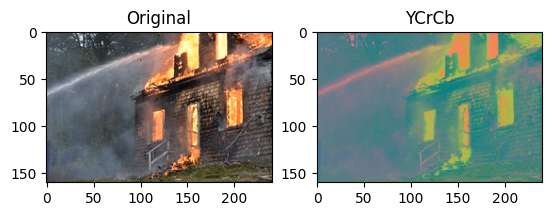

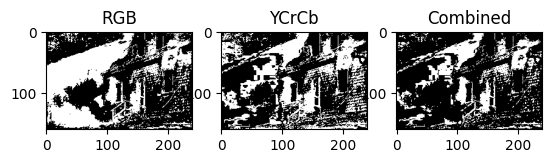

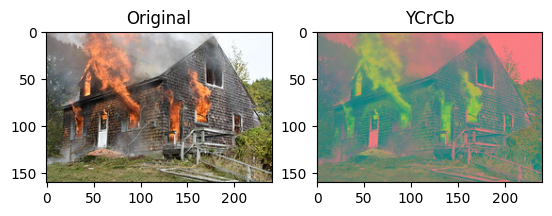

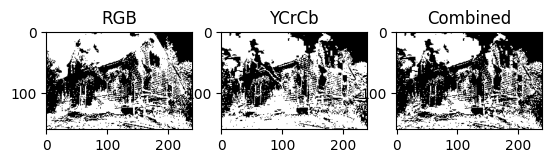

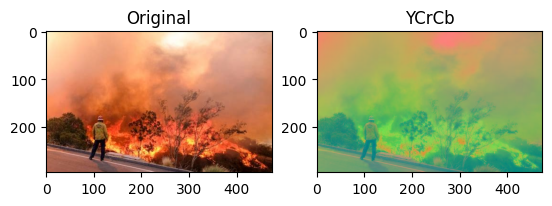

...

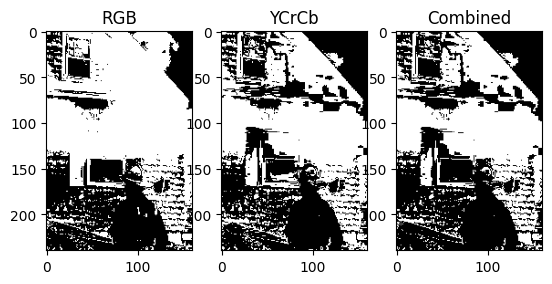

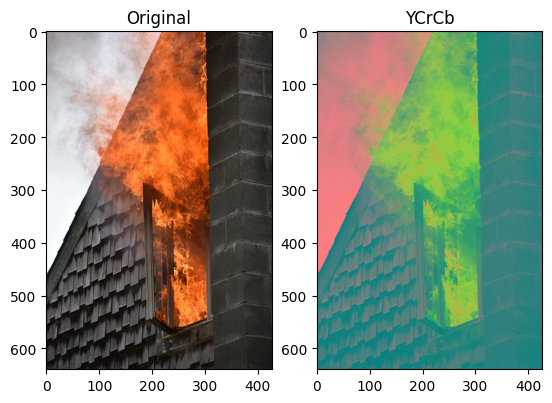

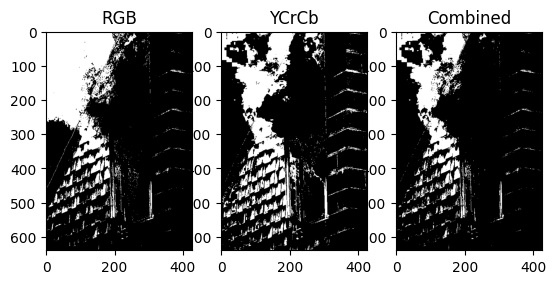

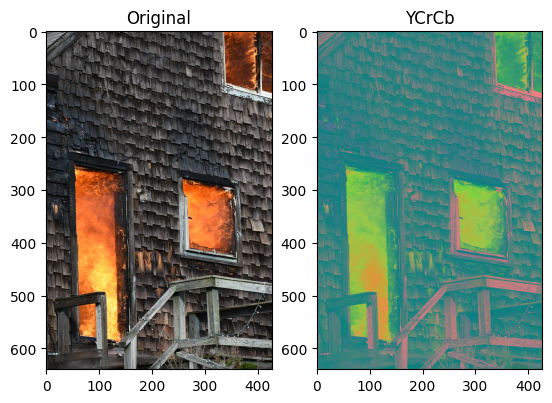

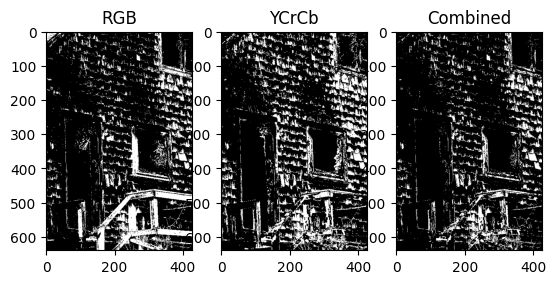

In [54]:
#analysis of the smoke_mask segmentation
c = 445
for i in range(10):
    scene = cv2.imread(f"data/fire/fire{c}.jpg")
    combined_smoke = combined_threshhold_smoke(scene)
    c += 1

<h3>Fire intensity calculations</h3>

In [ ]:
class FireIntensityAnalyzer:
    def __init__(self):
        
        #weights for intensity score
        self.weights = {
            'area': 0.4,
            'brightness': 0.3,
            'color_temperature': 0.2,
            'flicker_frequency': 0.1
        }
    
    def extract_intensity_features(self, image_rgb, fire_mask):
        """
        Extract all intensity features from fire regions
        
        Args:
            image_rgb: Original RGB image
            fire_mask: Binary mask where 255 indicates fire pixels
            
        Returns:
            Dictionary containing all intensity features
        """
        features = {}
        
        #converting to other color spaces
        image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)
        image_ycrcb = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2YCrCb)
        
        #getting fire region coordinates
        fire_pixels = fire_mask == 255
        num_fire_pixels = np.sum(fire_pixels)
        
        if num_fire_pixels == 0:
            #no fire detected
            return {
                'area': 0,
                'brightness': 0,
                'color_temperature_rb': 0,
                'color_temperature_rg': 0,
                'color_temperature_br': 0,
                'intensity_score': 0,
                'has_fire': False
            }
        
        #feature1: area/size
        features['area'] = self._calculate_fire_area(fire_mask)
        
        #feature2: average brightness
        features['brightness'] = self._calculate_average_brightness(image_hsv, image_ycrcb, fire_pixels)
        
        #feature3: color temperature
        color_temp_features = self._calculate_color_temperature(image_rgb, fire_pixels)
        features.update(color_temp_features)
        
        #calculating overall intensity score
        features['intensity_score'] = self._calculate_intensity_score(features)
        features['has_fire'] = True
        
        return features
    
    def _calculate_fire_area(self, fire_mask):
        """
        Calculate fire area in pixels
        """
        return cv2.countNonZero(fire_mask)
    
    def _calculate_average_brightness(self, image_hsv, image_ycrcb, fire_pixels):
        """
        Calculate average brightness in fire regions using multiple color spaces
        """
        #using HSV value channel
        v_channel = image_hsv[:, :, 2]
        brightness_hsv = np.mean(v_channel[fire_pixels])
        
        #using YCbCr Y channel (luminance)
        y_channel = image_ycrcb[:, :, 0]
        brightness_y = np.mean(y_channel[fire_pixels])
        
        #combining both methods for robustness
        average_brightness = (brightness_hsv + brightness_y) / 2
        
        return average_brightness
    
    def _calculate_color_temperature(self, image_rgb, fire_pixels):
        """
        Calculate color temperature ratios in fire regions
        """
        R = image_rgb[:, :, 0][fire_pixels]
        G = image_rgb[:, :, 1][fire_pixels]
        B = image_rgb[:, :, 2][fire_pixels]
        
        #avoiding division by zero
        R = np.maximum(R, 1)
        G = np.maximum(G, 1)
        B = np.maximum(B, 1)
        
        #red-to-blue ratio (higher = hotter flames)
        red_blue_ratio = np.mean(R / B)
        
        #red-to-green ratio
        red_green_ratio = np.mean(R / G)
        
        #blue-to-red ratio (inverse temperature)
        blue_red_ratio = np.mean(B / R)
        
        return {
            'color_temperature_rb': red_blue_ratio,
            'color_temperature_rg': red_green_ratio,
            'color_temperature_br': blue_red_ratio
        }
    
    def _normalize_features(self, features):
        """
        Normalize features to 0-1 range for combination
        """
        normalized = {}
        
        #area normalization (assuming max 10000 pixels for fire region)
        normalized['area'] = min(features['area'] / 10000.0, 1.0)
        
        #brightness normalization (0-255 range)
        normalized['brightness'] = features['brightness'] / 255.0
        
        #color temperature normalization (red-blue ratio)
        normalized['color_temperature'] = min(features['color_temperature_rb'] / 5.0, 1.0)
        
        return normalized

    def _calculate_intensity_score(self, features):
        """
        Calculate overall fire intensity score using weighted combination
        """
        #normalizing features to similar scales
        normalized_features = self._normalize_features(features)
        
        #weighted combination
        score = (
            self.weights['area'] * normalized_features['area'] +
            self.weights['brightness'] * normalized_features['brightness'] +
            self.weights['color_temperature'] * normalized_features['color_temperature'])
        
        return min(score, 1.0)  #max score = 1

def classify_intensity_level(intensity_score):
    """
    Classify fire intensity into categories based on score
    """
    if intensity_score == 0:
        return "No Fire"
    elif intensity_score < 0.3:
        return "Low Intensity"
    elif intensity_score < 0.6:
        return "Medium Intensity"
    elif intensity_score < 0.8:
        return "High Intensity"
    else:
        return "Very High Intensity"

def create_intensity_analysis_image(frame, fire_mask):
    """
    Create an image with fire overlayed fire mask
    """
    display_frame = frame.copy()
    
    #overlay fire mask
    fire_overlay = display_frame.copy()
    fire_overlay[fire_mask == 255] = [255, 0, 0]
    cv2.addWeighted(fire_overlay, 0.6, display_frame, 0.7, 0, display_frame)
    
    return display_frame

def analyze_single_image(image_bgr, fire_mask):
    """
    Analyze fire intensity in a single image
    """
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    
    analyzer = FireIntensityAnalyzer()
    features = analyzer.extract_intensity_features(image_rgb, fire_mask)
    intensity_level = classify_intensity_level(features['intensity_score'])
    
    print("FIRE INTENSITY ANALYSIS RESULTS:")
    print(f"Intensity Level: {intensity_level}")
    print(f"Overall Score: {features['intensity_score']:.3f}")
    print(f"Fire Area: {features['area']} pixels")
    print(f"Average Brightness: {features['brightness']:.1f}")
    print(f"Red/Blue Ratio: {features['color_temperature_rb']:.2f}")
    
    return features, intensity_level

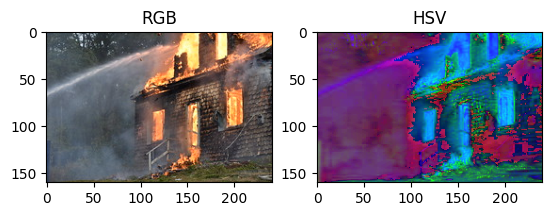

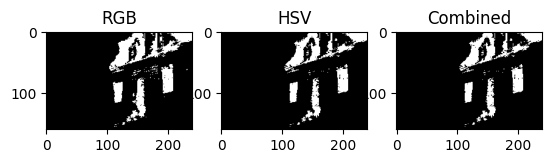

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: Medium Intensity
Overall Score: 0.511
Fire Area: 4420 pixels
Average Brightness: 196.8
Red/Blue Ratio: 2.58


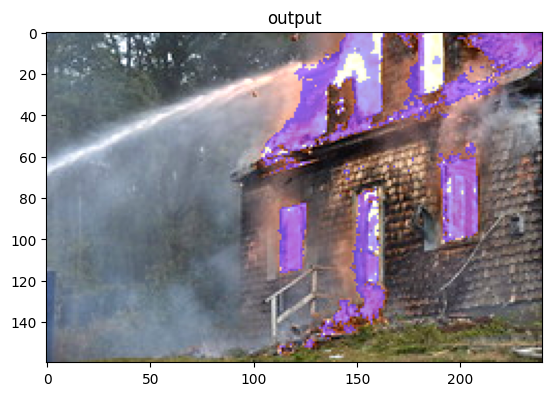

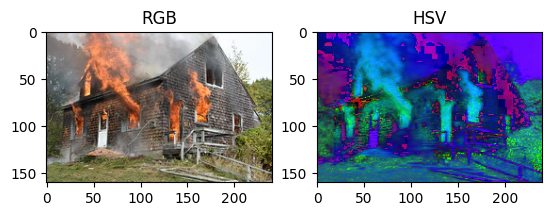

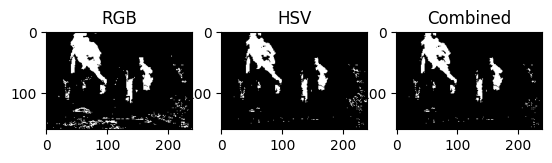

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: Medium Intensity
Overall Score: 0.456
Fire Area: 3240 pixels
Average Brightness: 177.9
Red/Blue Ratio: 2.93


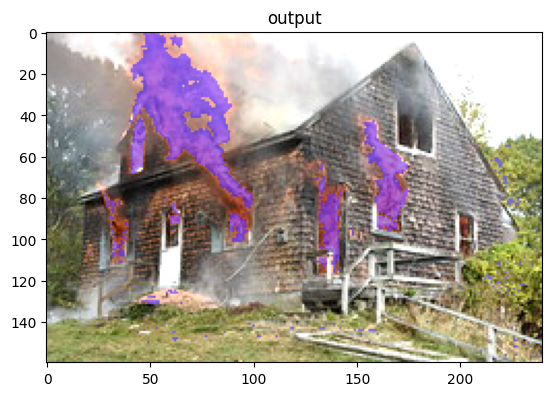

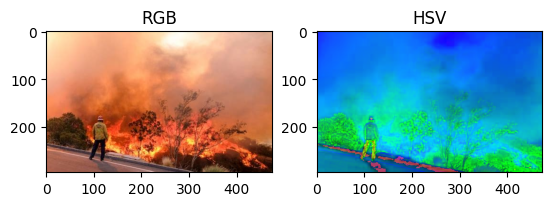

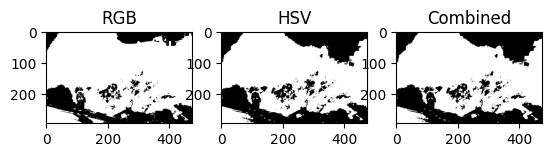

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: High Intensity
Overall Score: 0.784
Fire Area: 92068 pixels
Average Brightness: 182.4
Red/Blue Ratio: 4.23


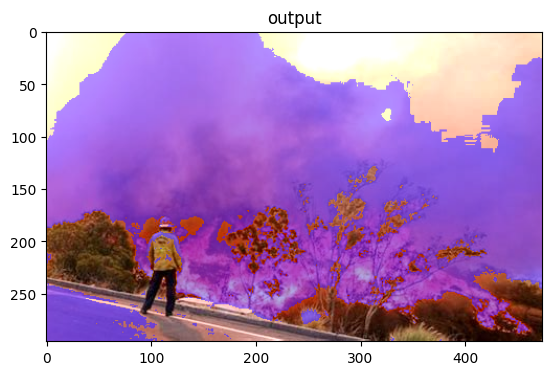

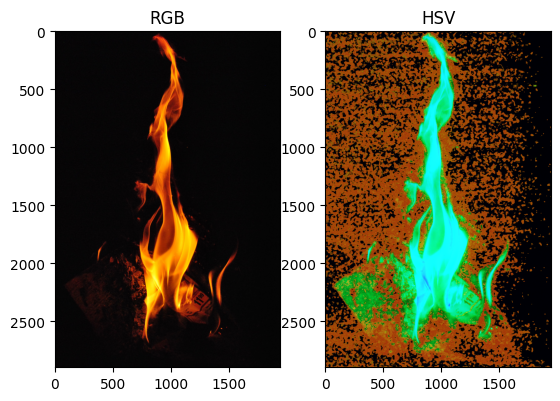

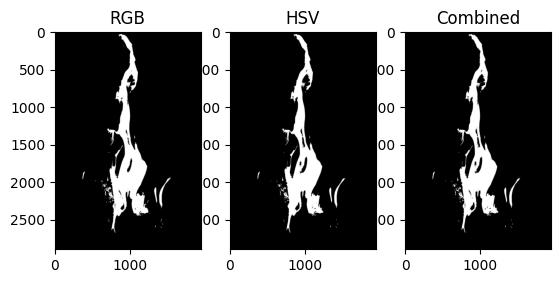

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: Very High Intensity
Overall Score: 0.813
Fire Area: 465981 pixels
Average Brightness: 180.8
Red/Blue Ratio: 107.42


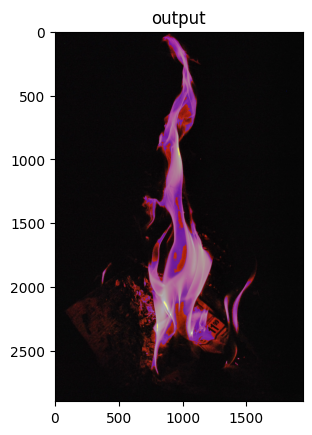

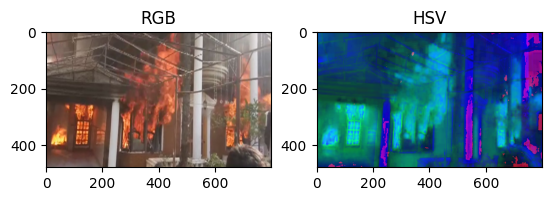

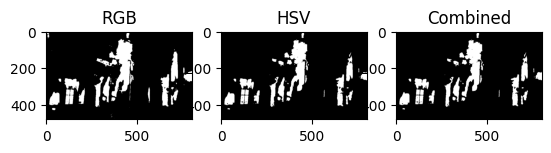

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: High Intensity
Overall Score: 0.723
Fire Area: 46603 pixels
Average Brightness: 163.3
Red/Blue Ratio: 3.27


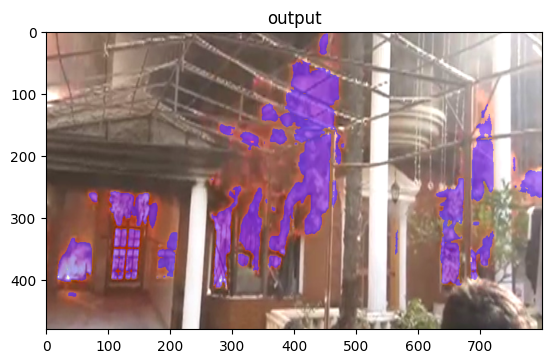

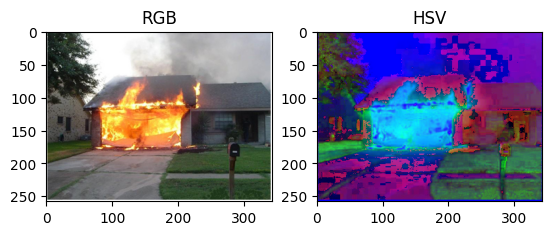

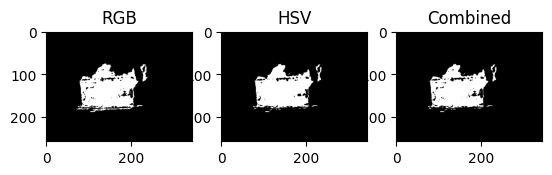

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: Very High Intensity
Overall Score: 0.812
Fire Area: 9373 pixels
Average Brightness: 201.5
Red/Blue Ratio: 5.52


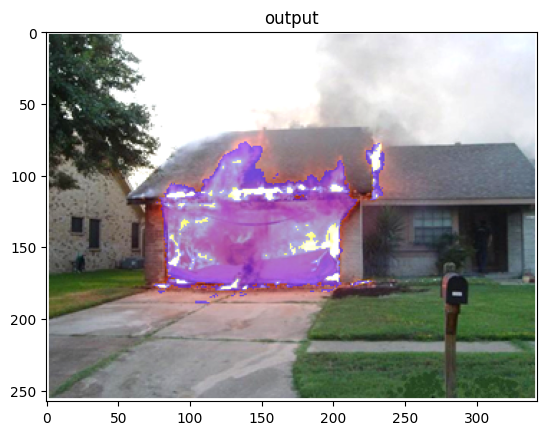

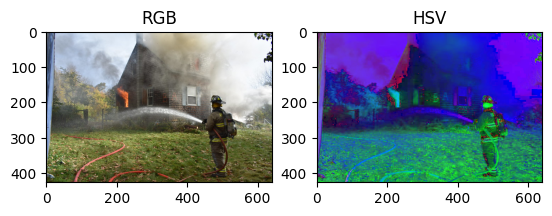

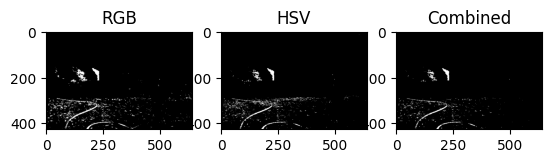

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: Medium Intensity
Overall Score: 0.444
Fire Area: 4037 pixels
Average Brightness: 163.3
Red/Blue Ratio: 2.25


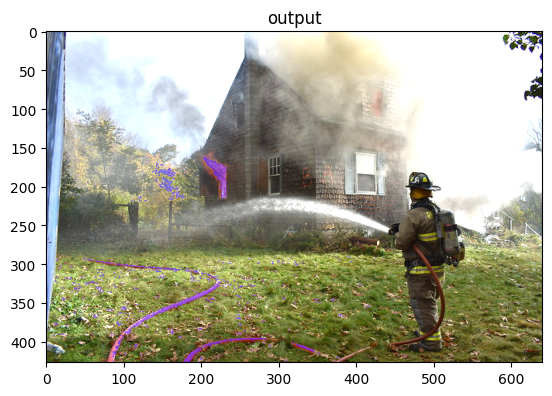

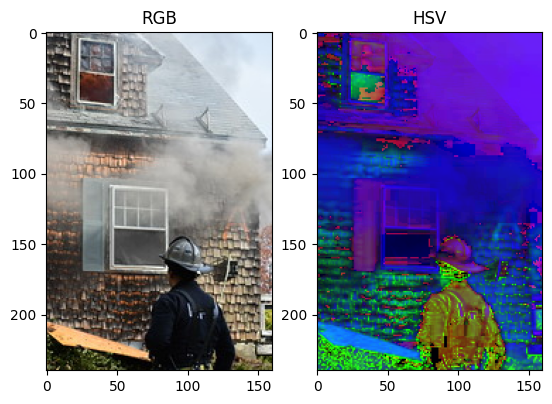

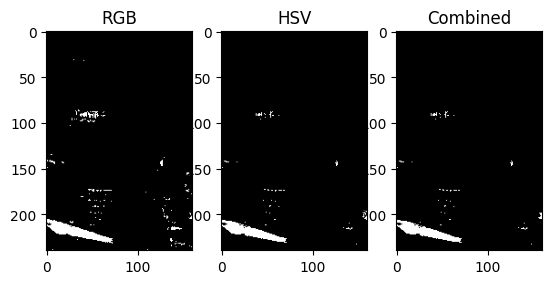

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: Medium Intensity
Overall Score: 0.356
Fire Area: 733 pixels
Average Brightness: 210.3
Red/Blue Ratio: 1.98


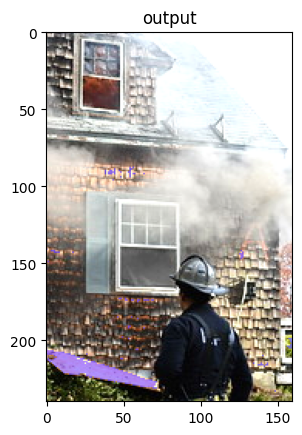

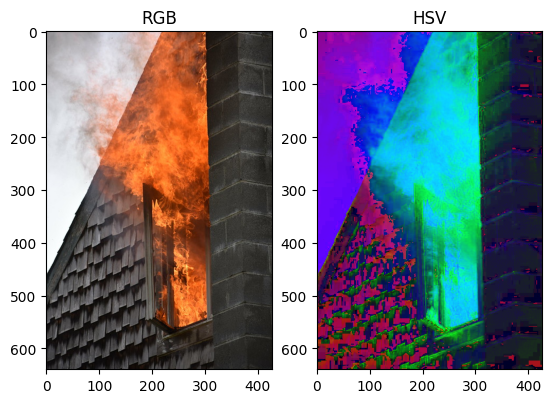

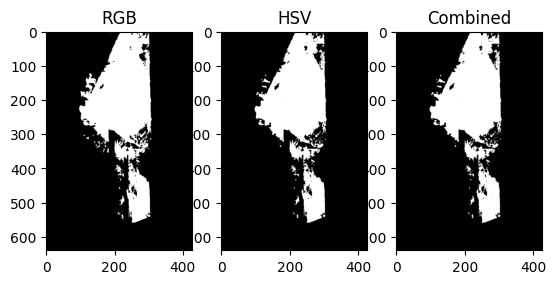

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: Very High Intensity
Overall Score: 0.805
Fire Area: 54421 pixels
Average Brightness: 174.2
Red/Blue Ratio: 7.06


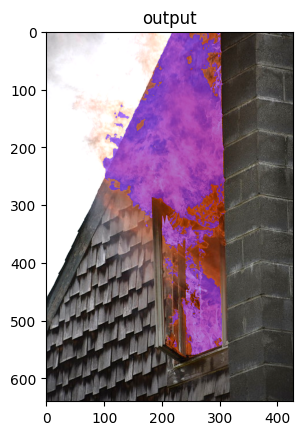

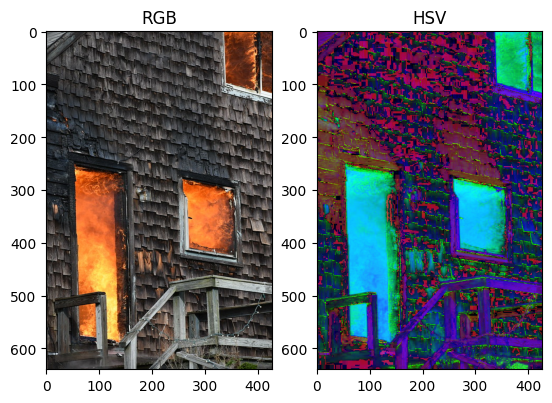

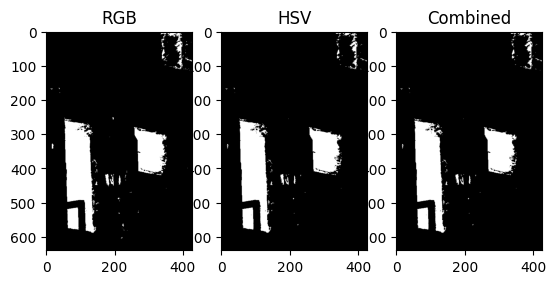

FIRE INTENSITY ANALYSIS RESULTS:
Intensity Level: Very High Intensity
Overall Score: 0.825
Fire Area: 30907 pixels
Average Brightness: 190.9
Red/Blue Ratio: 6.45


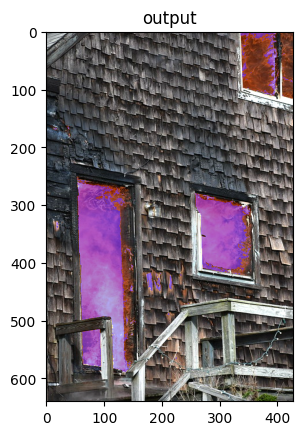

In [52]:
#analysis of the fire intensity calculation
c = 445
for i in range(10):
    scene = cv2.imread(f"data/fire/fire{c}.jpg")
    combined_fire_mask = combined_threshhold_fire(scene)
    # combined_smoke_mask = combined_threshhold_smoke(scene)
    # combined = cv2.bitwise_and(combined_fire_mask, cv2.bitwise_not(combined_smoke_mask))
    features, level = analyze_single_image(scene, combined_fire_mask)
    output = cv2.cvtColor(create_intensity_analysis_image(scene, combined_fire_mask), cv2.COLOR_BGR2RGB)
    showInRow([output], ['output'])
    c += 1

<h3>Smoke intensity calculations</h3>

In [ ]:
class SmokeIntensityAnalyzer:
    def __init__(self):
        
        #weights for intensity score
        self.weights = {
            'area': 0.3,
            'density': 0.4,      #more important for smoke than brightness
            'color_purity': 0.2  #how "gray" the smoke is
        }
    
    def extract_intensity_features(self, image_rgb, smoke_mask):
        """
        Extract all intensity features from smoke regions
        
        Args:
            image_rgb: Original RGB image
            smoke_mask: Binary mask where 255 indicates smoke pixels
            
        Returns:
            Dictionary containing all smoke intensity features
        """
        features = {}
        
        #converting to other color spaces
        image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)
        image_ycrcb = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2YCrCb)
        
        # getting smoke region coordinates
        smoke_pixels = smoke_mask == 255
        num_smoke_pixels = np.sum(smoke_pixels)
        
        if num_smoke_pixels == 0:
            #if no smoke detected
            return {
                'area': 0,
                'density': 0,
                'color_purity': 0,
                'opacity': 0,
                'intensity_score': 0,
                'has_smoke': False
            }
        
        #feature 1: area/size
        features['area'] = self._calculate_smoke_area(smoke_mask)
        
        #feature 2: smoke density
        features['density'] = self._calculate_smoke_density(image_rgb, image_hsv, image_ycrcb, smoke_pixels)
        
        #feature 3: color purity (how gray/desaturated the smoke is)
        features['color_purity'] = self._calculate_color_purity(image_rgb, smoke_pixels)
        
        #feature 4: opacity (how much smoke obscures background)
        features['opacity'] = self._calculate_opacity(image_rgb, smoke_pixels)
        
        #calculating intensity score
        features['intensity_score'] = self._calculate_intensity_score(features)
        features['has_smoke'] = True
        
        return features
    
    def _calculate_smoke_area(self, smoke_mask):
        """
        Calculate smoke area in pixels
        """
        return cv2.countNonZero(smoke_mask)
    
    def _calculate_smoke_density(self, image_rgb, image_hsv, image_ycrcb, smoke_pixels):
        """
        Calculate smoke density using multiple metrics
        """
        #method 1: texture complexity (dense smoke has more texture)
        gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
        smoke_region_gray = gray[smoke_pixels]
        
        if len(smoke_region_gray) > 1:
            texture_complexity = np.std(smoke_region_gray)
        else:
            texture_complexity = 0
        
        #method 2: edge density (dense smoke has fewer sharp edges)
        edges = cv2.Canny(gray, 50, 150)
        edge_density_in_smoke = np.mean(edges[smoke_pixels]) / 255.0
        
        #method 3: color consistency (dense smoke is more uniform)
        r_channel = image_rgb[:, :, 0][smoke_pixels]
        g_channel = image_rgb[:, :, 1][smoke_pixels]
        b_channel = image_rgb[:, :, 2][smoke_pixels]
        
        color_variation = (np.std(r_channel) + np.std(g_channel) + np.std(b_channel)) / 3
        
        #combine metrics - dense smoke has medium texture, low edge density, low color variation
        density_score = (
            min(texture_complexity / 30.0, 1.0) * 0.4 +
            (1.0 - edge_density_in_smoke) * 0.4 +
            max(0, 1.0 - color_variation / 40.0) * 0.2
        )
        
        return min(density_score, 1.0)
    
    def _calculate_color_purity(self, image_rgb, smoke_pixels):
        """
        Calculate how "pure" the smoke color is (how close to ideal gray)
        """
        R = image_rgb[:, :, 0][smoke_pixels]
        G = image_rgb[:, :, 1][smoke_pixels]
        B = image_rgb[:, :, 2][smoke_pixels]
        
        #calculating color balance (ideal smoke has R ≈ G ≈ B)
        mean_r, mean_g, mean_b = np.mean(R), np.mean(G), np.mean(B)
        
        #calculating deviation from perfect gray
        max_channel = max(mean_r, mean_g, mean_b)
        min_channel = min(mean_r, mean_g, mean_b)
        
        if max_channel > 0:
            color_deviation = (max_channel - min_channel) / max_channel
            # 1.0 = perfect gray, 0.0 = colorful
            color_purity = 1.0 - color_deviation
        else:
            color_purity = 0
        
        return color_purity
    
    def _calculate_opacity(self, image_rgb, smoke_pixels):
        """
        Calculate smoke opacity (how much it obscures background)
        """
        #converting to LAB color space for better perception
        image_lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2LAB)
        l_channel = image_lab[:, :, 0]  # Lightness channel
        
        #smoke typically reduces contrast and lightness
        smoke_lightness = l_channel[smoke_pixels]
        
        if len(smoke_lightness) > 0:
            #thick smoke has lower and more uniform lightness
            lightness_std = np.std(smoke_lightness)
            lightness_mean = np.mean(smoke_lightness)
            
            #opacity is higher when lightness is low and uniform
            opacity = (
                (1.0 - lightness_mean / 255.0) * 0.7 +
                max(0, 1.0 - lightness_std / 50.0) * 0.3
            )
        else:
            opacity = 0
        
        return min(opacity, 1.0)
    
    def _calculate_intensity_score(self, features):
        """
        Calculate overall smoke intensity score using weighted combination
        """
        #normalizing features to similar scales
        normalized_features = self._normalize_features(features)
        
        #weighted combination
        score = (
            self.weights['area'] * normalized_features['area'] +
            self.weights['density'] * normalized_features['density'] +
            self.weights['color_purity'] * normalized_features['color_purity']
        )
        
        return min(score, 1.0)  # Cap at 1.0
    
    def _normalize_features(self, features):
        """
        Normalize features to 0-1 range for combination
        """
        normalized = {}
        
        #area normalization
        normalized['area'] = min(features['area'] / 50000.0, 1.0)
        normalized['density'] = features['density']
        normalized['color_purity'] = features['color_purity']
        
        return normalized
    
    def update_weights(self, new_weights):
        """
        Update the weights for intensity score calculation
        """
        self.weights.update(new_weights)

        total = sum(self.weights.values())
        if total != 1.0:
            # normalizing weights
            for key in self.weights:
                self.weights[key] /= total

def classify_smoke_intensity_level(intensity_score):
    """
    Classify smoke intensity into categories based on score
    """
    if intensity_score == 0:
        return "No Smoke"
    elif intensity_score < 0.2:
        return "Light Smoke"
    elif intensity_score < 0.4:
        return "Moderate Smoke"
    elif intensity_score < 0.6:
        return "Dense Smoke"
    elif intensity_score < 0.8:
        return "Very Dense Smoke"
    else:
        return "Extremely Dense Smoke"

def create_smoke_analysis_image(frame, smoke_mask):
    """
    Create an image with smoke overlay and analysis information
    """
    display_frame = frame.copy()
    
    #overlaying smoke mask
    smoke_overlay = display_frame.copy()
    smoke_overlay[smoke_mask == 255] = [255, 0, 0]
    cv2.addWeighted(smoke_overlay, 0.4, display_frame, 0.7, 0, display_frame)
    
    return display_frame

def analyze_single_image_smoke(image_bgr, smoke_mask):
    """
    Analyze smoke intensity in a single image
    """
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    
    analyzer = SmokeIntensityAnalyzer()
    features = analyzer.extract_intensity_features(image_rgb, smoke_mask)
    intensity_level = classify_smoke_intensity_level(features['intensity_score'])
    
    print("SMOKE INTENSITY ANALYSIS RESULTS:")
    print(f"Intensity Level: {intensity_level}")
    print(f"Overall Score: {features['intensity_score']:.3f}")
    print(f"Smoke Area: {features['area']} pixels")
    print(f"Smoke Density: {features['density']:.3f}")
    print(f"Color Purity: {features['color_purity']:.3f}")
    print(f"Opacity: {features['opacity']:.3f}")
    
    return features, intensity_level

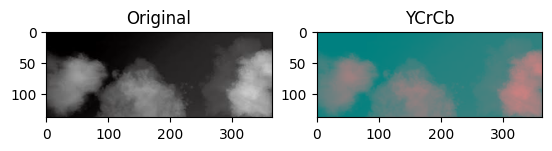

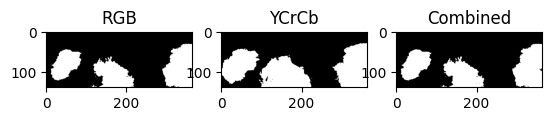

SMOKE INTENSITY ANALYSIS RESULTS:
Intensity Level: Very Dense Smoke
Overall Score: 0.607
Smoke Area: 14659 pixels
Smoke Density: 0.797
Color Purity: 1.000
Opacity: 0.449
Spread Rate: 0.000


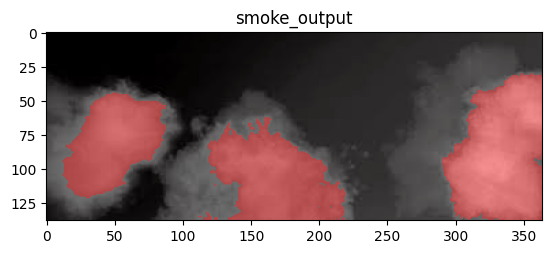

In [ ]:
image_bgr = cv2.imread('data/onlySmoke/images5.jpeg')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
smoke_mask = combined_threshhold_smoke(image_rgb)

features, level = analyze_single_image_smoke(image_bgr, smoke_mask)
out = create_smoke_analysis_image(image_bgr, smoke_mask)
showInRow([out], ['smoke_output'])

Future ideas: enhance smoke detection, smoke intensity, smoke and fire using contours/connectedComponents, interaction between smoke and fire masks, combine fire/smoke masks